**End-to-End mutli-class Dog Breed Classification**
This notebook builds an end-to-end multi-class image classifier using Tensorflow 2.0 and TensorFlow Hub.
Using MultiClassLogLoss Evaluation Metric.


In [9]:
#!unzip /content/drive/MyDrive/DogVision/dog-breed-identification -d /content/drive/MyDrive/DogVision

In [10]:
import tensorflow as tf
print(tf.__version__)

2.18.0


In [11]:
# import tensorflow_hub as hub
# import tensorflow as tf
# print("TF version", tf.__version__)

# #Check for GPU availability
# print("GPU", "available(YESSSSS!)" if tf.config.list_physical_devices("GPU") else "not available :(")

In [12]:
import pandas as pd
labels_cv = pd.read_csv("/content/drive/MyDrive/DogVision/labels.csv")
labels_cv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

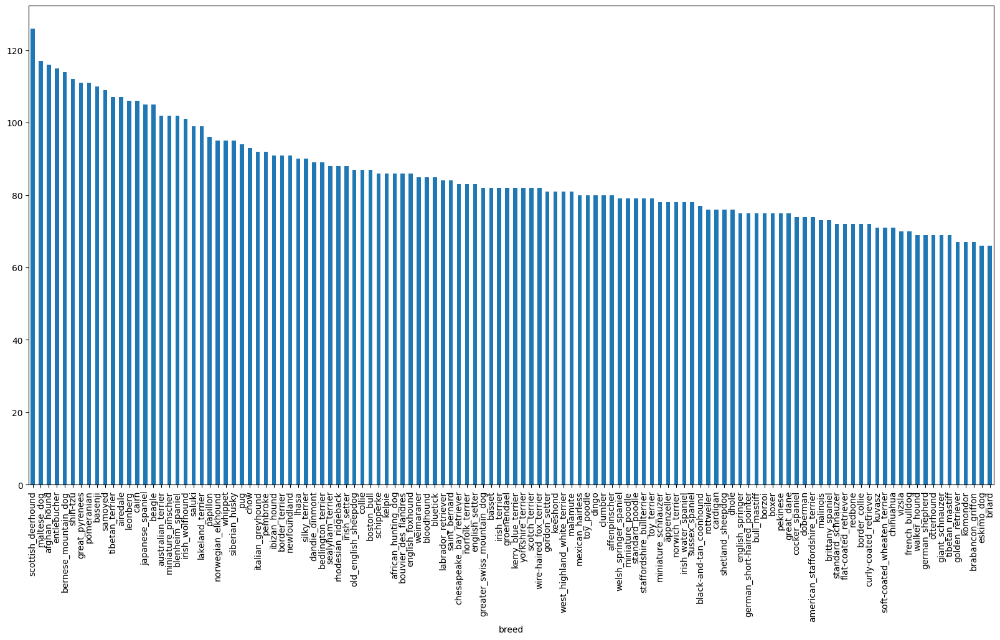

In [13]:
#How images per each breed
labels_cv["breed"].value_counts().plot.bar(figsize=(20,10))

In [14]:
labels_cv["breed"].value_counts().median()

82.0

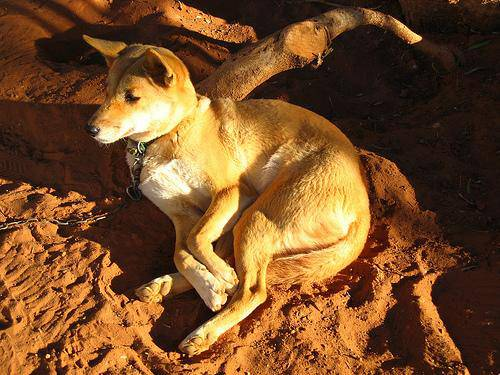

In [15]:
from IPython.display import Image
Image("/content/drive/MyDrive/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

In [16]:
labels_cv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [17]:
filenames = ["/content/drive/MyDrive/DogVision/train/" + fname + ".jpg" for fname in labels_cv["id"]]
filenames[:10]

['/content/drive/MyDrive/DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/DogVision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/DogVision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/DogVision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/DogVision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/DogVision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/DogVision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/DogVision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/DogVision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [18]:
import os

if len(os.listdir("/content/drive/MyDrive/DogVision/train/")) == len(filenames):
    print("Filenames match actual amount.Proceed")
else:
    print("Filenames do not match actual amount.Fix")

Filenames match actual amount.Proceed


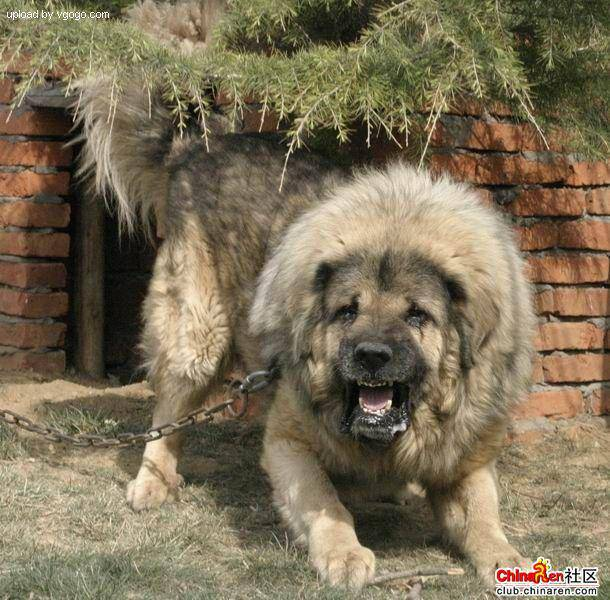

In [19]:
Image(filenames[9000])

In [20]:
import numpy as np
labels = labels_cv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [21]:
len(labels)

10222

In [22]:
if len(labels) == len(filenames):
    print("Labels match actual amount.Proceed")
else:
    print("Labels do not match actual amount.Fix")

Labels match actual amount.Proceed


In [23]:
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [24]:
print(labels[0]) #boolan array
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [25]:
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [26]:
len(boolean_labels)

10222

In [27]:
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))


boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [28]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [29]:
X= filenames
y = boolean_labels

In [30]:
NUM_IMAGES= 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [31]:
#Creating my own validation set

from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [32]:
#Turning images into tensors
import tensorflow as tf
IMG_SIZE = 224

def process_image(image_path, image_size= IMG_SIZE):
    """
    Takes an image file path and turns it into a Tensor.
    """
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3) #3 RGB - Numerical Tensors
    image = tf.image.convert_image_dtype(image, tf.float32) #normalization between 0-1
    image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

    return image

In [33]:
#Turning data into batches - 32 size
#Return a tuple of tensors

def get_image_label(image_path, label):
    """
    Takes an image file path name and the associated label,
    processes the image and returns a tuple of (image, label).
    """
    image = process_image(image_path)
    return image, label

In [34]:
(process_image(X[0]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.5705322 , 0.33588538, 0.15008473],
         [0.66901225, 0.4601166 , 0.26022965],
         [0.61062384, 0.43763596, 0.21601713],
         ...,
         [0.8182312 , 0.7297958 , 0.26963907],
         [0.72454786, 0.6059109 , 0.2653059 ],
         [0.7494603 , 0.6252918 , 0.32456532]],
 
        [[0.6761415 , 0.4733761 , 0.30642927],
         [0.5672121 , 0.38192675, 0.20349538],
         [0.5883547 , 0.4322571 , 0.2403155 ],
         ...,
         [0.9326942 , 0.8260503 , 0.41093278],
         [0.86072475, 0.74250627, 0.3694122 ],
         [0.76781666, 0.6461604 , 0.29291284]],
 
        [[0.46350825, 0.29595745, 0.1536156 ],
         [0.42554107, 0.27039403, 0.12009468],
         [0.7887875 , 0.6547362 , 0.49015   ],
         ...,
         [0.89372385, 0.7696401 , 0.41811958],
         [0.88609535, 0.7585918 , 0.36495727],
         [0.8243601 , 0.69494826, 0.2930575 ]],
 
        ...,
 
        [[0.7344025 , 0.4716574 

In [104]:
BATCH_SIZE = 32

def create_data_batches(X,y=None,batch_size= BATCH_SIZE, valid_data = False , test_data = False):
  #if data is a test dataset
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Datasets.from_tensor_slices((tf.constant(X),)) #only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
    #if data is a valid dataset, no need to shuffle it
  elif valid_data:
   print("Creating validation data batches...")
   data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
   data_batch = data.map(get_image_label).batch(BATCH_SIZE)
   return data_batch

  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    #Shuffle pathnames and labels
    data = data.shuffle(buffer_size= len(X))
    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [105]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


Visualizing Data Batches

In [106]:
import matplotlib.pyplot as plt

def show_25_images(images, labels):
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax = plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")


In [107]:
train_images , train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[3.45931739e-01, 1.82868853e-01, 2.05629304e-01],
          [4.07728583e-01, 2.50471145e-01, 2.60867089e-01],
          [3.86709154e-01, 2.54091501e-01, 2.43701085e-01],
          ...,
          [1.00129239e-01, 1.74639031e-01, 5.46326786e-02],
          [1.10210612e-01, 1.76877275e-01, 4.92685549e-02],
          [1.14277035e-01, 1.75008684e-01, 4.46428582e-02]],
 
         [[3.98990184e-01, 2.65543014e-01, 2.68082321e-01],
          [3.78399342e-01, 2.59579301e-01, 2.47957870e-01],
          [3.31008255e-01, 2.25163355e-01, 1.96355566e-01],
          ...,
          [1.13725498e-01, 1.73864394e-01, 6.01388924e-02],
          [1.09500691e-01, 1.68324217e-01, 4.67555858e-02],
          [1.09589919e-01, 1.65445939e-01, 3.79422978e-02]],
 
         [[1.94594249e-01, 1.06422335e-01, 8.67664889e-02],
          [2.09590867e-01, 1.38315007e-01, 1.01876594e-01],
          [1.80701897e-01, 1.21832810e-01, 6.73597679e-02],
          ...,
          [1.29709199e-01, 1.79744199e-01, 7.0255

In [108]:
len(train_images), len(train_labels)

(32, 32)

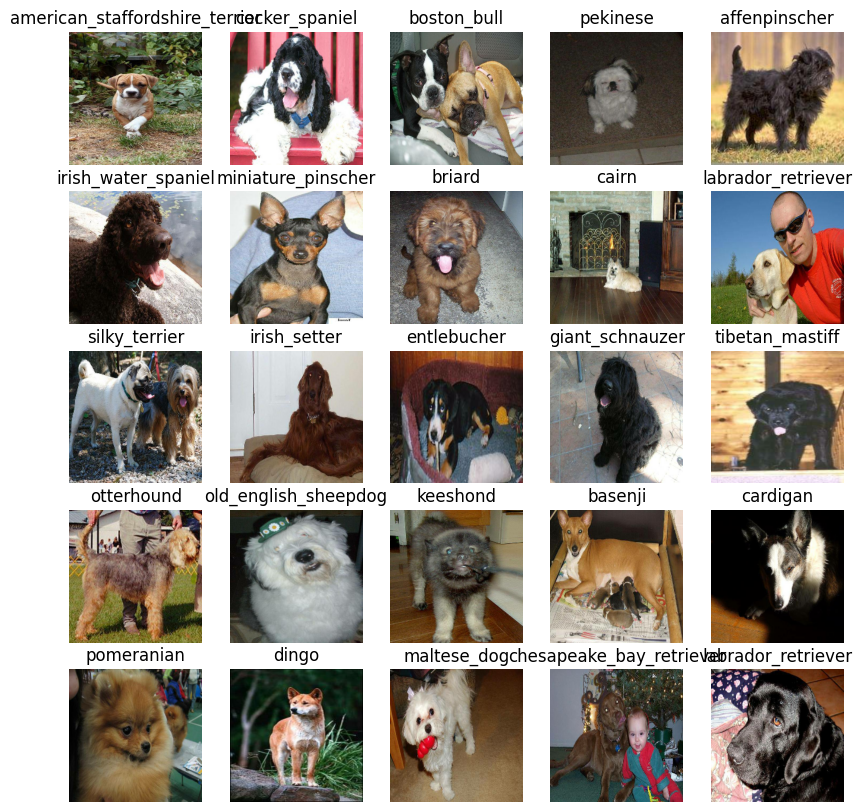

In [109]:
show_25_images(train_images , train_labels)

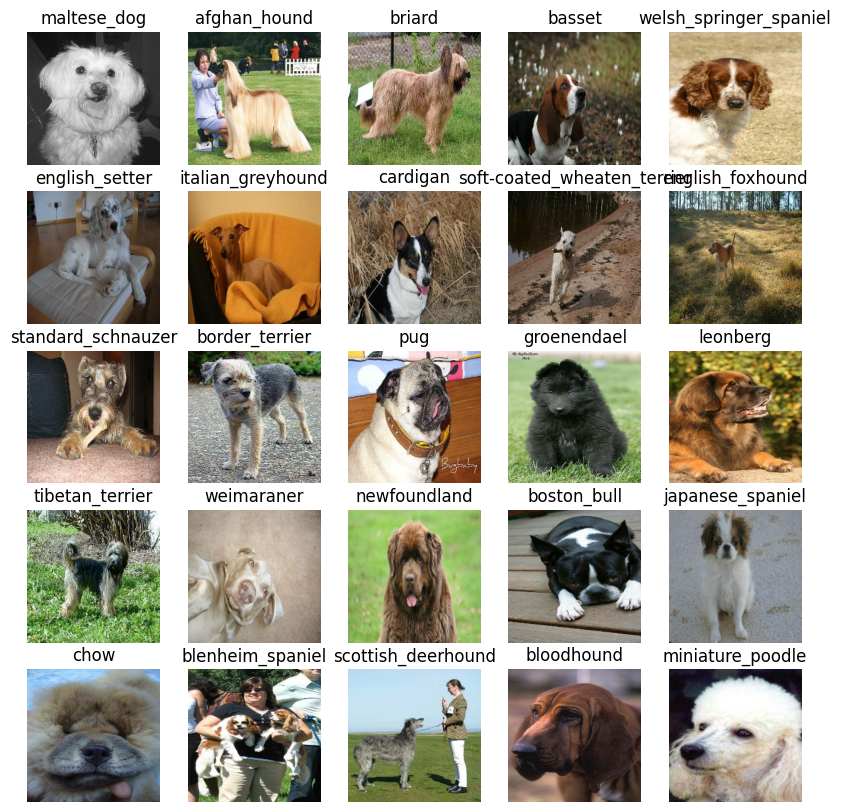

In [110]:
train_images , train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images , train_labels) #shuffles

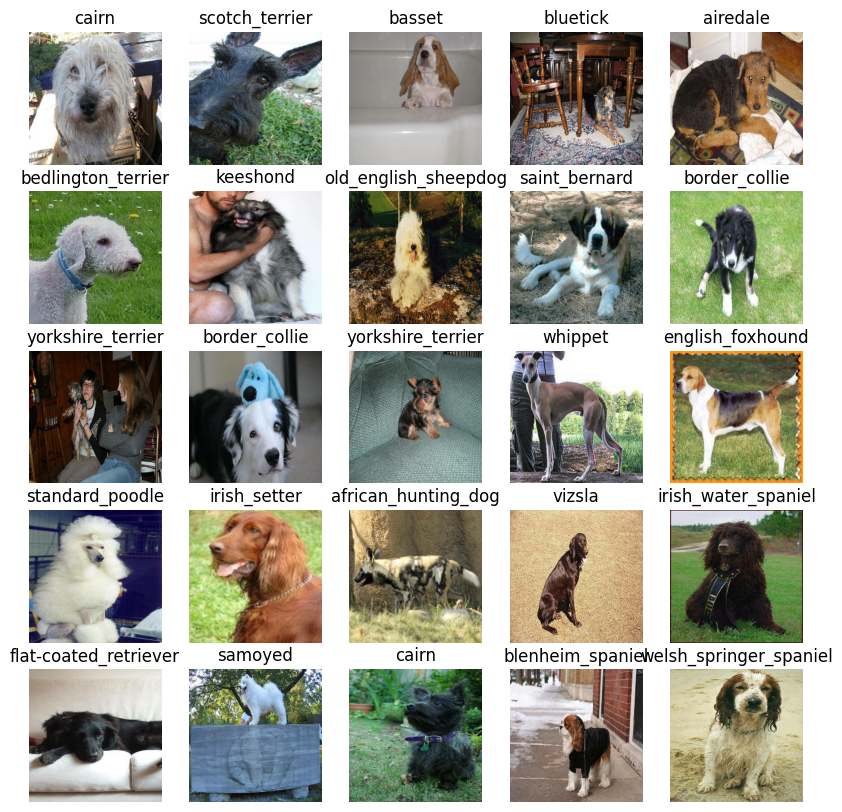

In [111]:
val_images , val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images , val_labels)

**Building a model:**

1- Consider input shape (our image shape, in form of Tensors) to our model

2- The output shape as well (image labels, in the form of Tensors) to our model.

3- The URL of the model we want to use

In [112]:
# INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]
# OUTPUT_SHAPE = len(unique_breeds)
# MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [113]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import MobileNetV2

IMG_SIZE = 224
INPUT_SHAPE = (IMG_SIZE, IMG_SIZE, 3)
OUTPUT_SHAPE = len(unique_breeds)

def create_model():
    print("Building model using tf.keras.applications.MobileNetV2")

    base_model = MobileNetV2(
        input_shape=INPUT_SHAPE,
        include_top=False,
        weights='imagenet'
    )

    base_model.trainable = False

    model = models.Sequential([
        base_model,
        layers.GlobalAveragePooling2D(),
        layers.Dense(OUTPUT_SHAPE, activation='softmax')
    ])

    model.compile(
        optimizer='adam',
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

model = create_model()
model.summary()


Building model using tf.keras.applications.MobileNetV2


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_4           │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 120)                 │         153,720 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,411,704 (9.20 MB)

 Trainable params: 153,720 (600.47 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [114]:
model = create_model()
model.summary()

Building model using tf.keras.applications.MobileNetV2


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_5           │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 120)                 │         153,720 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,411,704 (9.20 MB)

 Trainable params: 153,720 (600.47 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [115]:
outputs = np.ones(shape = (1,1, 1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

In [116]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [117]:
import datetime

def create_tensorboard_callback():
  logdir = os.path.join("drive/MyDrive/DogVision/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)


In [118]:
#Early stopping callback - to avoid overfitting
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
patience = 3)

In [119]:
#Training a model (on a subset of data)
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}


In [120]:
print("GPU", "available(YESSSSS!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available(YESSSSS!)


In [121]:
def train_model():

  model = create_model()
  tensorboard = create_tensorboard_callback() #to save to logs

  #fit the model to the data
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  return model


In [122]:
model = train_model()

Building model using tf.keras.applications.MobileNetV2
Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 16s 361ms/step - accuracy: 0.0438 - loss: 4.8758 - val_accuracy: 0.2550 - val_loss: 3.6428
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 13s 142ms/step - accuracy: 0.6139 - loss: 2.2193 - val_accuracy: 0.4700 - val_loss: 2.4641
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 165ms/step - accuracy: 0.9027 - loss: 0.9679 - val_accuracy: 0.5350 - val_loss: 2.0228
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 8s 275ms/step - accuracy: 0.9595 - loss: 0.5339 - val_accuracy: 0.5950 - val_loss: 1.7978
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 141ms/step - accuracy: 0.9928 - loss: 0.2893 - val_accuracy: 0.5950 - val_loss: 1.6747
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 177ms/step - accuracy: 0.9987 - loss: 0.1999 - val_accuracy: 0.6150 - val_loss: 1.6428
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - accuracy: 0.9937 - loss: 0.1591 - val_accuracy: 0.6100 - val_loss: 1.6096
Epoch 8/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3

In [123]:
%tensorboard --logdir drive/MyDrive/DogVision/logs

Reusing TensorBoard on port 6006 (pid 11799), started 1:28:07 ago. (Use '!kill 11799' to kill it.)

<IPython.core.display.Javascript object>

In [124]:
#Making now predictions

prediction = model.predict(val_data, verbose= 1)
prediction

7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 644ms/step


array([[1.4818525e-03, 3.7817557e-03, 1.8734782e-04, ..., 1.7793069e-04,
        2.1609366e-04, 1.3485223e-03],
       [2.5210097e-03, 2.9155307e-03, 2.0953652e-03, ..., 1.5215586e-04,
        5.7367738e-03, 4.4491293e-04],
       [1.5494770e-04, 2.1177910e-03, 4.7179867e-04, ..., 1.0794061e-04,
        2.5468215e-05, 2.3757422e-03],
       ...,
       [3.7409517e-04, 6.2417402e-04, 1.9831321e-04, ..., 3.3769041e-04,
        4.6062101e-05, 1.6902345e-04],
       [1.6082565e-03, 8.8964283e-05, 2.3762551e-04, ..., 3.7375667e-05,
        1.7459963e-05, 1.0314164e-02],
       [2.1439494e-04, 8.9054856e-06, 3.5037231e-04, ..., 6.8173377e-04,
        1.6768872e-03, 4.0653109e-04]], dtype=float32)

In [125]:

index = 0
print(prediction[index])
print(f"Max value (probabilirt of prediction): {np.max(prediction[index])}")
print(f"Sum: {np.sum(prediction[index])}")
print(f"Max index: {np.argmax(prediction[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(prediction[index])]}")

[1.48185249e-03 3.78175569e-03 1.87347818e-04 1.69413572e-03
 1.43023964e-04 2.67257710e-04 6.98437914e-03 2.99118692e-04
 1.31196552e-03 5.81417698e-05 1.02605380e-03 3.86729342e-04
 2.79654516e-04 9.67402084e-05 2.00817434e-04 1.31928828e-04
 4.55187692e-05 1.56345647e-02 1.59115167e-04 2.36415057e-04
 2.25521089e-03 3.25437373e-04 1.58178464e-05 6.14182383e-04
 2.21334949e-06 7.51222397e-05 1.62140038e-02 1.07343898e-04
 1.23085361e-03 2.60001514e-04 1.32497487e-04 4.38025827e-03
 1.36099319e-04 1.88709018e-04 2.10308019e-04 1.37954541e-02
 9.66043081e-05 5.02478324e-05 5.62664209e-05 4.03147824e-05
 1.72178447e-03 1.29059035e-05 2.69118864e-05 1.44997088e-04
 1.85079887e-04 2.03799616e-04 3.29537361e-05 1.82355987e-04
 4.73142922e-04 6.80967933e-04 5.26874028e-05 1.30728993e-04
 3.67324660e-03 3.70306407e-05 1.42796753e-05 2.75308339e-05
 7.84471194e-05 2.70534982e-03 8.83381872e-05 2.35700887e-02
 1.77890470e-04 1.25378589e-04 5.60136068e-05 1.57683571e-05
 5.99502127e-05 3.375695

In [126]:
unique_breeds[51]

'great_dane'

In [127]:
#let us visualize
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label = get_pred_label(prediction[0])
pred_label


'tibetan_terrier'

In [128]:
images_ = []
labels_ = []

#loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0] , labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [129]:
get_pred_label(labels_[0])

'cairn'

In [130]:
get_pred_label(prediction[0])

'tibetan_terrier'

In [131]:
def unbatchify(data):
  images = []
  labels = []

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images , labels

val_images , vlal_labels = unbatchify(val_data)
val_images[0], vlal_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [132]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  pred_prob , true_label, image = prediction_probabilities[n], labels[n], images[n]

  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{}{:2.0f}% {}".format(pred_label, np.max(pred_prob) *100, true_label), color=color)


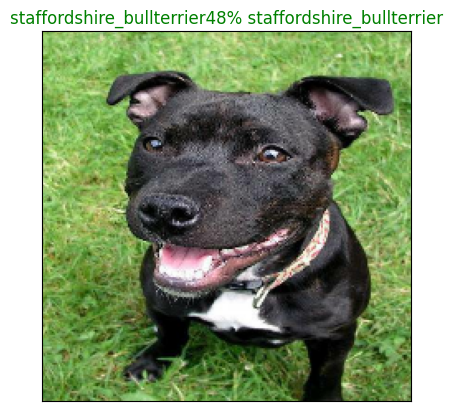

In [133]:
plot_pred(prediction_probabilities=prediction, labels=vlal_labels, images=val_images, n=50)

In [134]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  pred_prob , true_label = prediction_probabilities[n], labels[n]

  pred_label = get_pred_label(pred_prob)

  #Find the top 10 predicrion confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  #Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  #Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  #Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  #Change color of true label
  # Get the index of the true label within unique_breeds
  true_label_index = np.argmax(true_label)
  true_label_name = unique_breeds[true_label_index]

  if np.isin(true_label_name, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label_name)].set_color("green")
  else:
    pass

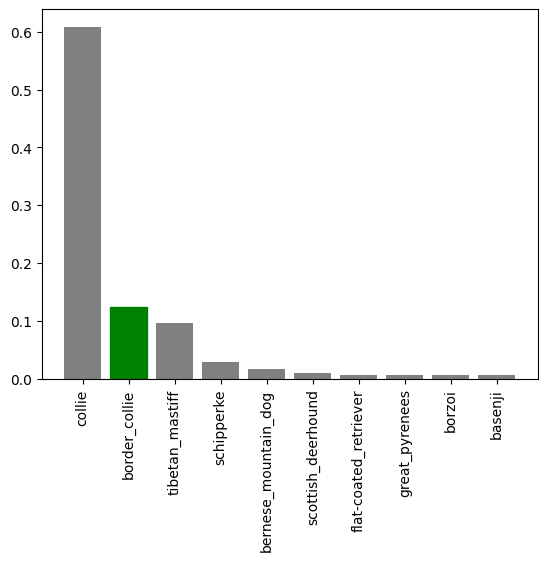

In [135]:
plot_pred_conf(prediction_probabilities = prediction, labels = val_labels , n=9)

In [75]:
def plot_pred(prediction_probabilities, labels, images, n=1):
    """
    Plots an image with predicted and true labels.

    Args:
        prediction_probabilities: NumPy array of prediction probabilities.
        labels: List of true labels (as strings or one-hot encoded arrays).
        images: List of images.
        n: Index of the image to plot.
    """
    pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

    pred_label = get_pred_label(pred_prob)

    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    # If true_label is one-hot encoded, convert it to a string
    if isinstance(true_label, (np.ndarray, list)):
        true_label = unique_breeds[np.argmax(true_label)]

    if pred_label == true_label:
        color = "green"
    else:
        color = "red"

    plt.title("{}{:2.0f}% {}".format(pred_label, np.max(pred_prob) * 100, true_label), color=color)

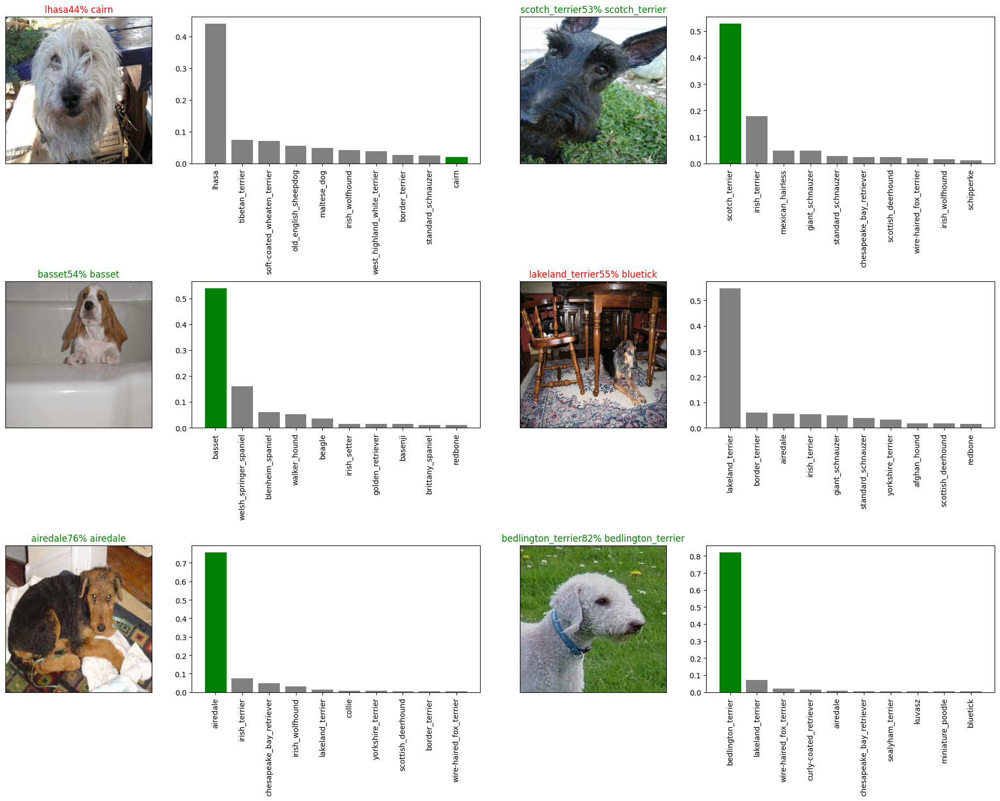

In [76]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10* num_cols , 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2* num_cols, 2*i+1)
  plot_pred(prediction_probabilities=prediction, labels=val_labels, images=val_images, n=i+i_multiplier)
  plt.subplot(num_rows, 2* num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=prediction, labels=val_labels, n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0)
plt.show()


In [82]:
def save_model(model , suffix= None):
  modeldir = os.path.join("drive/MyDrive/DogVision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [86]:
def load_model(model_path):
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path)
  return model

In [87]:
save_model(model,suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/DogVision/models/20250402-163124-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/DogVision/models/20250402-163124-1000-images-mobilenetv2-Adam.h5'

In [91]:
loaded_1000_image_model = load_model('/content/drive/MyDrive/DogVision/models/20250402-162944-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/DogVision/models/20250402-162944-1000-images-mobilenetv2-Adam.h5


In [92]:
model.evaluate(val_data) #presaved

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - accuracy: 0.6275 - loss: 1.4644


[1.4995769262313843, 0.6299999952316284]

In [93]:
load_1000_image_model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - accuracy: 0.6275 - loss: 1.4644


[1.4995769262313843, 0.6299999952316284]

Training on the full dataset

In [94]:
full_data = create_data_batches(X,y)

Creating training data batches...


In [95]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [96]:
full_model = create_model()

Building model using tf.keras.applications.MobileNetV2


In [97]:
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience = 3)

In [98]:
full_model.fit(x=full_data ,
               epochs=NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 50s 134ms/step - accuracy: 0.4515 - loss: 2.4956
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 76s 122ms/step - accuracy: 0.8360 - loss: 0.5670
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 45s 135ms/step - accuracy: 0.9055 - loss: 0.3661
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 85s 146ms/step - accuracy: 0.9429 - loss: 0.2495
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 75s 125ms/step - accuracy: 0.9665 - loss: 0.1790
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - accuracy: 0.9828 - loss: 0.1330
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - accuracy: 0.9920 - loss: 0.0954
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 122ms/step - accuracy: 0.9943 - loss: 0.0786
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - accuracy: 0.9959 - loss: 0.0620
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - accuracy: 0.9982 - loss: 0.0500
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - accuracy: 0.9988 - loss: 0.0401
Epoch 12

In [99]:
save_model(full_model, suffix="full-dataset-mobilenetv2-Adam")

Saving model to: drive/MyDrive/DogVision/models/20250402-170324-full-dataset-mobilenetv2-Adam.h5...


'drive/MyDrive/DogVision/models/20250402-170324-full-dataset-mobilenetv2-Adam.h5'

In [100]:
loaded_full_model = load_model('drive/MyDrive/DogVision/models/20250402-170324-full-dataset-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/DogVision/models/20250402-170324-full-dataset-mobilenetv2-Adam.h5


In [101]:
#Load test image file names
test_path = "drive/MyDrive/DogVision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/DogVision/test/e904aa7e76ba608b3f658aa3817e12b9.jpg',
 'drive/MyDrive/DogVision/test/f50e3cf5abd93afce432348daa6c4789.jpg',
 'drive/MyDrive/DogVision/test/ec390da7ac7297a2477e3b838e7c502d.jpg',
 'drive/MyDrive/DogVision/test/f00367f07cfcbb8152c9ed908d7c273f.jpg',
 'drive/MyDrive/DogVision/test/ea8fab5f4003724ac49ea787216998b1.jpg',
 'drive/MyDrive/DogVision/test/ed0b66d283d948128c45ce57478ba048.jpg',
 'drive/MyDrive/DogVision/test/ee0582b96b135f5e036e011d53baa087.jpg',
 'drive/MyDrive/DogVision/test/e9fda9f4a21d4249b9d4a77d06ad751a.jpg',
 'drive/MyDrive/DogVision/test/f282ea683674bf3bde3715cb018b1c26.jpg',
 'drive/MyDrive/DogVision/test/eb48e06416db42a71d5c232191fec3a0.jpg']

In [102]:
len(test_filenames)

10357

In [137]:
def create_data_batches(X,y=None,batch_size= BATCH_SIZE, valid_data = False , test_data = False):
  #if data is a test dataset
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),)) #only filepaths # Changed Datasets to Dataset
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
    #if data is a valid dataset, no need to shuffle it
  elif valid_data:
   print("Creating validation data batches...")
   data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
   data_batch = data.map(get_image_label).batch(BATCH_SIZE)
   return data_batch

  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    #Shuffle pathnames and labels
    data = data.shuffle(buffer_size= len(X))
    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [138]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [139]:
test_predictions = loaded_full_model.predict(test_data , verbose=1)

324/324 ━━━━━━━━━━━━━━━━━━━━ 1777s 5s/step


In [140]:
np.savetxt("drive/MyDrive/DogVision/preds_array.csv" , test_predictions, delimiter=",")

In [141]:
test_predictions = np.loadtxt("drive/MyDrive/DogVision/preds_array.csv", delimiter=",")

In [142]:
test_predictions[:10]

array([[1.34429842e-10, 8.73015882e-09, 3.71003246e-08, ...,
        1.92852454e-08, 1.03688831e-06, 1.83269988e-09],
       [2.36046469e-12, 6.60908654e-06, 1.38372502e-06, ...,
        1.28577184e-02, 2.03700310e-08, 2.17166072e-08],
       [1.09880132e-08, 3.82693997e-06, 2.66991262e-10, ...,
        1.52898224e-06, 6.16554871e-06, 3.83222065e-10],
       ...,
       [1.66159545e-12, 7.43420462e-13, 3.19983873e-10, ...,
        2.24325469e-09, 4.69930654e-08, 1.04229039e-11],
       [1.16263457e-10, 7.09275270e-08, 4.22600266e-07, ...,
        3.51165272e-06, 1.14804789e-06, 3.66686737e-10],
       [1.37633249e-09, 9.83198037e-11, 1.08984446e-10, ...,
        9.29856400e-11, 6.56354207e-11, 2.26294088e-11]])

In [143]:
#Prepare for kaggle
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [146]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]

In [147]:
test_ids

['e904aa7e76ba608b3f658aa3817e12b9',
 'f50e3cf5abd93afce432348daa6c4789',
 'ec390da7ac7297a2477e3b838e7c502d',
 'f00367f07cfcbb8152c9ed908d7c273f',
 'ea8fab5f4003724ac49ea787216998b1',
 'ed0b66d283d948128c45ce57478ba048',
 'ee0582b96b135f5e036e011d53baa087',
 'e9fda9f4a21d4249b9d4a77d06ad751a',
 'f282ea683674bf3bde3715cb018b1c26',
 'eb48e06416db42a71d5c232191fec3a0',
 'e9fe358382731f9288768526be01c950',
 'f3ad6585619f3489fe3c01b4e305f70b',
 'ef9de7d5f286c09daf1807e2ae67c98d',
 'eab189c5274b79b36dd566fea4e9847e',
 'f4eb5c8121abd476cfc36684e74e83a5',
 'f0933ef7831649c79490ebb34de07a01',
 'f157256196b2c6e28a739d2947e956e5',
 'eb06356375888d41903fff14ef7c4104',
 'e97b5b2fd6542fa588cd4a5da2b6e052',
 'e94e14137d29b0db653e5903acac5fef',
 'edbff7f90e9b8f5dd4cf25ce67fa2efa',
 'ef9432cc6dc7ab7ba38d18abffe6d1a0',
 'eb3849def6fa245bcaae9ab9c64f024f',
 'e8f51d54d179b05ea4cc9c726cae9229',
 'e9574ebd4785c1e1a1470dfc93f9271e',
 'f49dbff2463687f867bfe1bc88f0a7c3',
 'e8232c9a79f0e77e9b4c5fca60682d41',
 

In [148]:
preds_df["id"] = test_ids

In [150]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e904aa7e76ba608b3f658aa3817e12b9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,f50e3cf5abd93afce432348daa6c4789,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ec390da7ac7297a2477e3b838e7c502d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f00367f07cfcbb8152c9ed908d7c273f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,ea8fab5f4003724ac49ea787216998b1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [151]:
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e904aa7e76ba608b3f658aa3817e12b9,1.344298e-10,8.730159e-09,3.710032e-08,3.635785e-11,3.265266e-07,1.165474e-05,3.407372e-10,5.454968e-07,1.471266e-07,...,2.146187e-08,1.243643e-02,2.230231e-11,3.169147e-09,1.992784e-07,9.495513e-07,1.362146e-01,1.928525e-08,1.036888e-06,1.832700e-09
1,f50e3cf5abd93afce432348daa6c4789,2.360465e-12,6.609087e-06,1.383725e-06,1.350149e-09,5.423188e-08,4.421179e-05,1.894916e-11,9.779229e-06,5.998593e-05,...,5.255099e-09,3.575335e-06,5.045866e-07,3.402132e-04,6.203504e-07,1.706767e-04,1.934014e-09,1.285772e-02,2.037003e-08,2.171661e-08
2,ec390da7ac7297a2477e3b838e7c502d,1.098801e-08,3.826940e-06,2.669913e-10,3.781878e-02,6.241284e-10,5.571982e-09,1.355680e-11,1.477432e-08,3.212367e-06,...,2.103488e-04,1.211032e-10,1.216722e-08,9.574949e-08,3.164119e-09,2.622291e-06,7.290756e-08,1.528982e-06,6.165549e-06,3.832221e-10
3,f00367f07cfcbb8152c9ed908d7c273f,1.816304e-05,8.612478e-03,8.206463e-09,4.755792e-09,1.157376e-09,1.913474e-09,6.616542e-09,3.614404e-11,1.629191e-07,...,1.677980e-04,8.515998e-11,2.934026e-06,1.143169e-11,1.130770e-08,9.846070e-08,2.170468e-09,5.703315e-09,3.283947e-12,1.248367e-06
4,ea8fab5f4003724ac49ea787216998b1,4.953806e-07,1.477894e-08,1.072532e-07,1.122872e-07,3.263109e-09,2.492975e-10,9.560789e-08,1.456116e-09,2.748474e-09,...,1.662849e-08,1.368260e-06,9.790130e-12,3.310690e-10,1.175888e-10,7.533333e-08,8.235555e-07,2.481370e-07,1.096571e-06,4.485805e-05


In [152]:
preds_df.to_csv("drive/MyDrive/DogVision/full_model_predictions_submission_1_mobilenetV2.csv",
                index = False)

Making predictions on custom images,wohooo!!!

In [153]:
custom_path = "drive/MyDrive/DogVision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths

['drive/MyDrive/DogVision/my-dog-photos/dog3.jpg',
 'drive/MyDrive/DogVision/my-dog-photos/dog4.jpg',
 'drive/MyDrive/DogVision/my-dog-photos/dog1.jpeg']

In [154]:
#Turn custom images into batches datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [155]:
custom_preds = loaded_full_model.predict(custom_data)
custom_preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


array([[1.63179743e-06, 2.13529888e-10, 4.54421425e-08, 8.04028399e-09,
        3.97161415e-09, 5.95059890e-10, 4.36404400e-04, 2.70447054e-10,
        3.73787401e-09, 1.10155054e-06, 2.49355259e-10, 7.49216300e-10,
        3.77510290e-09, 6.86713349e-07, 5.18903898e-09, 5.11921492e-08,
        3.63291197e-09, 1.65825008e-06, 6.03507392e-12, 1.63850203e-07,
        2.00992611e-10, 1.84703737e-07, 2.45885587e-08, 1.03660938e-08,
        3.45884787e-09, 5.08416287e-09, 4.72675801e-08, 8.13092982e-10,
        1.41663858e-09, 2.15271044e-07, 1.08766347e-08, 6.75715839e-08,
        7.60963346e-08, 3.93450134e-10, 1.45739226e-10, 2.78003699e-05,
        2.46285714e-10, 1.49818977e-10, 1.39651095e-11, 2.86036667e-10,
        8.94313189e-07, 6.36105169e-10, 2.61305875e-08, 6.53171517e-10,
        3.40285355e-09, 1.18818221e-07, 8.86215198e-11, 8.26610794e-11,
        2.34950087e-10, 2.17197305e-09, 1.06259701e-09, 2.52220271e-08,
        4.21203156e-10, 2.44152121e-09, 3.45792076e-11, 4.708572

In [156]:
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['shih-tzu', 'rottweiler', 'golden_retriever']

In [157]:
custom_images =[]

for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

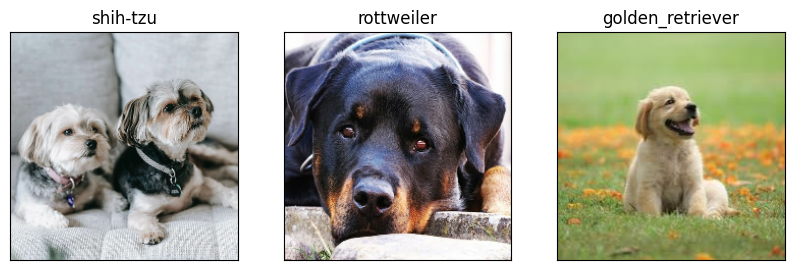

In [158]:
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

DONEEE!